<div class='alert alert-block' style='background-color: #ffffff; border: 1px solid #333333; border-radius: 10px; padding: 20px; text-align: center;'> <h1 style='font-family: Arial, sans-serif; color: #000000; font-size: 36px;'>MACHINE LEARNING</h1> <h2 style='font-family: Arial, sans-serif; color: #333333; font-size: 28px;'>MDSAA-BA Program</h2> <hr style='border: 1px solid #555555;'> <h3 style='font-family: 'Open Sans', sans-serif; color: #666666; font-size: 24px;'>To Grant Or Not To Grant Project 2024/2025</h3> </div>

## Table of contents

1. [Importing Libraries](#1.-Importing-Libraries)
2. [Importing the data](#2.-Importing-the-data)
3. [Exploring the data](#3.-Exploring-the-data)
4. [Data Preparation](#4.-Data-Preparation)
5. [Visualizations](#5.-Visualizations)

## 1. Importing Libraries

In [1]:
# Data Handling Libraries
import pandas as pd  
import numpy as np   

# Visualization Libraries
import matplotlib.pyplot as plt  
import seaborn as sns

# Missing data visualization            
import missingno as msno         

# Statistical and Feature Selection Tools
from scipy.stats import chi2_contingency  # Chi-squared test
from sklearn.feature_selection import mutual_info_classif  # Mutual information for classification

from typing import List, Optional  

# Warnings
import warnings  
warnings.filterwarnings('ignore')  


<br>

## 2. Importing the data

The `display.max_columns` option controls the number of columns to be printed. By setting the `display.max_columns` option to `None`, Pandas will display all columns in the DataFrame.

In [2]:
# Displays all columns of the dataset
pd.set_option('display.max_columns', None)

In [3]:
train = pd.read_csv('../Data/train_data.csv')
test = pd.read_csv('../Data/test_data.csv')

<br>

## 3. Exploring the data

### **3.3.1**  Applying the `.head()` and `.shape()` method

To take a first look into the data, it is used the method `.head()` method, so that the five first rows of every feature in the dataset is displayed.

In [4]:
train.head()

,Accident Date,Age at Injury,Alternative Dispute Resolution,Assembly Date,Attorney/Representative,Average Weekly Wage,Birth Year,C-2 Date,C-3 Date,Carrier Name,Carrier Type,Claim Identifier,Claim Injury Type,County of Injury,COVID-19 Indicator,District Name,First Hearing Date,Gender,IME-4 Count,Industry Code,Industry Code Description,Medical Fee Region,OIICS Nature of Injury Description,WCIO Cause of Injury Code,WCIO Cause of Injury Description,WCIO Nature of Injury Code,WCIO Nature of Injury Description,WCIO Part Of Body Code,WCIO Part Of Body Description,Zip Code,Agreement Reached,WCB Decision,Number of Dependents
0,2019-12-30,31.0,N,2020-01-01,N,0.00,1988.0,2019-12-31,NaN,NEW HAMPSHIRE INSURANCE CO,1A. PRIVATE,5393875,2. NON-COMP,ST. LAWRENCE,N,SYRACUSE,NaN,M,NaN,44.0,RETAIL TRADE,I,NaN,27.0,FROM LIQUID OR GREASE SPILLS,10.0,CONTUSION,62.0,BUTTOCKS,13662,0.0,Not Work Related,1.0
1,2019-08-30,46.0,N,2020-01-01,Y,1745.93,1973.0,2020-01-01,2020-01-14,ZURICH AMERICAN INSURANCE CO,1A. PRIVATE,5393091,4. TEMPORARY,WYOMING,N,ROCHESTER,2020-02-21,F,4.0,23.0,CONSTRUCTION,I,NaN,97.0,REPETITIVE MOTION,49.0,SPRAIN OR TEAR,38.0,SHOULDER(S),14569,1.0,Not Work Related,4.0
2,2019-12-06,40.0,N,2020-01-01,N,1434.80,1979.0,2020-01-01,NaN,INDEMNITY INSURANCE CO OF,1A. PRIVATE,5393889,4. TEMPORARY,ORANGE,N,ALBANY,NaN,M,NaN,56.0,ADMINISTRATIVE AND SUPPORT AND WASTE MANAGEMEN...,II,NaN,79.0,OBJECT BEING LIFTED OR HANDLED,7.0,CONCUSSION,10.0,MULTIPLE HEAD INJURY,12589,0.0,Not Work Related,6.0
3,NaN,NaN,NaN,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,957648180,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2019-12-30,61.0,N,2020-01-01,N,NaN,1958.0,2019-12-31,NaN,STATE INSURANCE FUND,2A. SIF,5393887,2. NON-COMP,DUTCHESS,N,ALBANY,NaN,M,NaN,62.0,HEALTH CARE AND SOCIAL ASSISTANCE,II,NaN,16.0,"HAND TOOL, UTENSIL; NOT POWERED",43.0,PUNCTURE,36.0,FINGER(S),12603,0.0,Not Work Related,1.0


With this method, the first five rows of data are visualized. It thus becomes easier to relate the variables to their respective values. It is, therefore possible to make a few first conclusions about the data, for instance:

- the variable `Claim Identifier` can be set as index;
- there are missing values in the data;
- there are different types of data: categorical (nominal and ordinal) and numerical (discrete and continuous);
- the target variable `Claim Injury Type` is ordinal.

Using the `.shape()` method we can check how many rows and columns the train and test dataset have.

In [5]:
print('The train dataset has ', train.shape[0], ' rows and ', train.shape[1], ' columns.')
print('The dataset with the new examples has ', test.shape[0], ' rows and ', test.shape[1], ' columns.')

The train dataset has  593471  rows and  33  columns.
The dataset with the new examples has  387975  rows and  30  columns.


From the output above, we can see that the train dataset has 593469 rows and 32 columns. While the test dataset has 387975  rows and  29  columns, 3 columns less than the train. This might suggest that the additional columns in the train data are not relevant for prediction.

<br>

### **3.3.2**  Checking duplicate values

#### **3.3.2.1**  Duplicate values in the `Claim Identifier` feature

Before we set the variable `Claim Identifier` as index its important to check first if there is duplicate values in the data. 

These two methods allow us to check if there is duplicated identifiers in the dataset. This is possible, since the `.duplicated()` method provides a list with boolean values for each row, having False if the row is not a duplicate and True otherwise. Then, the `.sum()` method sums all the values contained in that list (as False corresponds to the value 0 and True to the value 1).

In [6]:
print(train['Claim Identifier'].duplicated().sum())

1


There is duplicate values, so it is necessary to check the indexes with the respective duplicate claim identifier, in order to drop one of them.

In [7]:
pd.concat(identifier for _, identifier in train.groupby('Claim Identifier') if len(identifier) > 1)


,Accident Date,Age at Injury,Alternative Dispute Resolution,Assembly Date,Attorney/Representative,Average Weekly Wage,Birth Year,C-2 Date,C-3 Date,Carrier Name,Carrier Type,Claim Identifier,Claim Injury Type,County of Injury,COVID-19 Indicator,District Name,First Hearing Date,Gender,IME-4 Count,Industry Code,Industry Code Description,Medical Fee Region,OIICS Nature of Injury Description,WCIO Cause of Injury Code,WCIO Cause of Injury Description,WCIO Nature of Injury Code,WCIO Nature of Injury Description,WCIO Part Of Body Code,WCIO Part Of Body Description,Zip Code,Agreement Reached,WCB Decision,Number of Dependents
257901,NaN,NaN,NaN,2021-05-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,292668076,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
526445,NaN,NaN,NaN,2022-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,292668076,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


From the output above, it is clear that the only different attribute is the `Assembly Date` for the remaining variables there is no information. Therefore, we proceed by deleting both records.

In [8]:
claimMode = train['Claim Identifier'].mode()
claimDateModeIndex = list(train[train['Claim Identifier'] == claimMode[0]].index)
claimDateModeIndex

[257901, 526445]

In [9]:
train.drop(claimDateModeIndex, inplace=True)

To make the use of these datasets more manageable, its index is defined as the feature `Claim Identifier` in the code below. 

In [10]:
train.set_index('Claim Identifier', inplace=True)
test.set_index('Claim Identifier', inplace=True)

<br>

#### **3.3.2.2**  Duplicate records in the dataset

Before proceeding, we check if there is any duplicated rows.

In [11]:
train[train.duplicated() == True]

,Accident Date,Age at Injury,Alternative Dispute Resolution,Assembly Date,Attorney/Representative,Average Weekly Wage,Birth Year,C-2 Date,C-3 Date,Carrier Name,Carrier Type,Claim Injury Type,County of Injury,COVID-19 Indicator,District Name,First Hearing Date,Gender,IME-4 Count,Industry Code,Industry Code Description,Medical Fee Region,OIICS Nature of Injury Description,WCIO Cause of Injury Code,WCIO Cause of Injury Description,WCIO Nature of Injury Code,WCIO Nature of Injury Description,WCIO Part Of Body Code,WCIO Part Of Body Description,Zip Code,Agreement Reached,WCB Decision,Number of Dependents
Claim Identifier,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
363651794,NaN,NaN,NaN,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
209507552,NaN,NaN,NaN,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
970865999,NaN,NaN,NaN,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
807753247,NaN,NaN,NaN,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
395971406,NaN,NaN,NaN,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
365870975,NaN,NaN,NaN,2022-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
327160035,NaN,NaN,NaN,2022-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
249875936,NaN,NaN,NaN,2022-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


From the ouput above, we can see that there is 18348 duplicated rows and it is, also, clear that there exists a lot of rows with missing values in all features, except `Assembly Date`. This missingness in the data is, also, applied to the target variable `Claim Injury Type`. Since no useful information is provided by these rows, we will proceed by removing these observations.

Before proceeding to the removal, we check if there are more rows with missing values in the target variable.

In [12]:
print(f'There are {train[train['Claim Injury Type'].isna()].shape[0]} rows with missing values in the target feature, which corresponds to {round((train['Claim Injury Type'].isna().sum() / len(train)) * 100, 2)}% of the entire dataset.')


There are 19443 rows with missing values in the target feature, which corresponds to 3.28% of the entire dataset.


In [13]:
train.dropna(subset=['Claim Injury Type'], inplace=True)

Let's see if more duplicated rows can be found in the dataset.

In [14]:
train[train.duplicated(keep=False)]

,Accident Date,Age at Injury,Alternative Dispute Resolution,Assembly Date,Attorney/Representative,Average Weekly Wage,Birth Year,C-2 Date,C-3 Date,Carrier Name,Carrier Type,Claim Injury Type,County of Injury,COVID-19 Indicator,District Name,First Hearing Date,Gender,IME-4 Count,Industry Code,Industry Code Description,Medical Fee Region,OIICS Nature of Injury Description,WCIO Cause of Injury Code,WCIO Cause of Injury Description,WCIO Nature of Injury Code,WCIO Nature of Injury Description,WCIO Part Of Body Code,WCIO Part Of Body Description,Zip Code,Agreement Reached,WCB Decision,Number of Dependents
Claim Identifier,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
5686981,NaN,0.0,N,2021-03-25,Y,0.0,1968.0,NaN,2021-03-16,ACE AMERICAN INSURANCE CO,1A. PRIVATE,1. CANCELLED,UNKNOWN,N,NYC,2022-10-24,M,NaN,NaN,NaN,UK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,07032,0.0,Not Work Related,0.0
5686771,NaN,0.0,N,2021-03-25,Y,0.0,1968.0,NaN,2021-03-16,ACE AMERICAN INSURANCE CO,1A. PRIVATE,1. CANCELLED,UNKNOWN,N,NYC,2022-10-24,M,NaN,NaN,NaN,UK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,07032,0.0,Not Work Related,0.0


We identified a single duplicated row, differing only in its index. Therefore, we will proceed to delete one of the duplicates.

In [15]:
train.drop_duplicates(keep='first', inplace=True)

<br>

#### **3.3.3** Applying the `.info()` method

The `` .info() `` method provides more information about the dataset, including the existence of missing values and the data type of the elements of each row.

In [16]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 574025 entries, 5393875 to 6165075
Data columns (total 32 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   Accident Date                       570337 non-null  object 
 1   Age at Injury                       574025 non-null  float64
 2   Alternative Dispute Resolution      574025 non-null  object 
 3   Assembly Date                       574025 non-null  object 
 4   Attorney/Representative             574025 non-null  object 
 5   Average Weekly Wage                 545374 non-null  float64
 6   Birth Year                          544947 non-null  float64
 7   C-2 Date                            559466 non-null  object 
 8   C-3 Date                            187244 non-null  object 
 9   Carrier Name                        574025 non-null  object 
 10  Carrier Type                        574025 non-null  object 
 11  Claim Injury Type       

From the output above we can get some insights: 
- some features have missing values;
- the variable `OIICS Nature of Injury Description` has no values;
- 11 variables are numerical and 21 categorical.

By applying the `.unique()` method on the variable `OIICS Nature of Injury Description` we get all the unique (non-duplicate) values of the column. We do this to confirm the insight taken above, that no values are present.

In [17]:
train['OIICS Nature of Injury Description'].unique()

array([nan])

From the output it is clear the column has missing values. Given the lack of meaningful data in this column, it will be removed from the dataset.

In [18]:
# axis = 1 specifies that we're dropping a column, not rows.
# inplace = True deletes the column without having to reassign `train`.
train.drop('OIICS Nature of Injury Description', axis = 1, inplace = True)

In [19]:
test.drop('OIICS Nature of Injury Description', axis = 1, inplace = True)

<br>

#### **3.3.4** Descriptive Statistics

By using the `.describe()` method we get different statistical measurements, such as mean and standard deviation, for the various features. By examining these statistics, we can gain insights into the distribution of the data, helping to identify anomalies.

##### 3.3.4.1 Numerical Features

By default, the .describe() method focuses on the numerical features of the dataset. We will begin our analysis with these features to gain insights into their characteristics and distributions.

In [20]:
train.describe()

,Age at Injury,Average Weekly Wage,Birth Year,IME-4 Count,Industry Code,WCIO Cause of Injury Code,WCIO Nature of Injury Code,WCIO Part Of Body Code,Agreement Reached,Number of Dependents
count,574025.000000,5.453740e+05,544947.000000,132803.000000,564068.000000,558386.000000,558369.000000,556944.000000,574025.000000,574025.000000
mean,42.114343,4.910892e+02,1886.767454,3.207337,58.645305,54.381143,41.013839,39.738146,0.046665,3.006564
std,14.256336,6.092924e+03,414.644789,2.832303,19.644175,25.874281,22.207521,22.365940,0.210921,2.000799
min,0.000000,0.000000e+00,0.000000,1.000000,11.000000,1.000000,1.000000,-9.000000,0.000000,0.000000
25%,31.000000,0.000000e+00,1965.000000,1.000000,45.000000,31.000000,16.000000,33.000000,0.000000,1.000000
50%,42.000000,0.000000e+00,1977.000000,2.000000,61.000000,56.000000,49.000000,38.000000,0.000000,3.000000
75%,54.000000,8.410000e+02,1989.000000,4.000000,71.000000,75.000000,52.000000,53.000000,0.000000,5.000000
max,117.000000,2.828079e+06,2018.000000,73.000000,92.000000,99.000000,91.000000,99.000000,1.000000,6.000000


Observations:

- The feature `Age at Injury` has a minimum age of 0 and a maximum age of 117, which is completly impossible. Therefore, these can be considered as inconsistencies in the data;
- The feature `Average Weekly Wage` has a standard deviation of approximatly 6092.92 monetary units which is very dispersed to the mean (491.09 monetary units), this means that there is a wide range in weekly wages, maybe due to outliers. Also, from the median we can see that 50% of the individuals have no salary, maybe because it was never reported when filling the claim. The maximum statistic shows that the maximum average weekly wage is 2828079, this might represent an outlier.
- The feature `Birth Year` suggests that there is a lot of inconsistencies in the year of birth. The mean birth year appears to be 1886.77, which is extremely low, meaning that we would have people with more than 100 years. It, also, has a large standard deviation, due to significant discrepancies in the data. 
- At least 2 IME-4 forms received per claim. From the `IME-4 Count`, we can see that the maximum number of claims received is 73, which can represent an outlier.
- From the feature `Agreement Reached` we can see that most of the agreements were not satisfied.
- On average, individuals have about three dependents, with the maximum being 6.

<br>

##### 3.3.4.2 Categorical Features

Next, we will examine the statistics for the categorical data. To achieve this, we will use the include parameter and set it to object. This will provide a summary that includes the count of entries, the number of unique values, the most frequent value, and the frequency of that top value for each categorical column.

In [21]:
train.describe(include=object)

,Accident Date,Alternative Dispute Resolution,Assembly Date,Attorney/Representative,C-2 Date,C-3 Date,Carrier Name,Carrier Type,Claim Injury Type,County of Injury,COVID-19 Indicator,District Name,First Hearing Date,Gender,Industry Code Description,Medical Fee Region,WCIO Cause of Injury Description,WCIO Nature of Injury Description,WCIO Part Of Body Description,Zip Code,WCB Decision
count,570337,574025,574025,574025,559466,187244,574025,574025,574025,574025,574025,574025,150797,574025,564068,574025,558386,558369,556944,545388,574025
unique,5539,3,897,2,2475,1648,2046,8,8,63,2,8,1094,4,20,5,74,56,54,10060,1
top,2020-03-01,N,2020-03-06,N,2021-05-11,2021-04-21,STATE INSURANCE FUND,1A. PRIVATE,2. NON-COMP,SUFFOLK,N,NYC,2022-04-15,M,HEALTH CARE AND SOCIAL ASSISTANCE,IV,LIFTING,STRAIN OR TEAR,LOWER BACK AREA,11236,Not Work Related
freq,1245,571411,1413,392291,1847,350,111144,285367,291078,60430,546504,270778,440,335217,114339,265981,46610,153373,51862,3302,574025


Observations:

- From the feature `Accident Date`, we can check that March 1, 2020 is the most common accident date, occurring 1245 times. This might suggest a possible concentration of injuries around that time; 

- From the feature `Alternative Dispute Resolution`, we can check that the vast majority of cases did not involve alternative dispute resolution (571 412 times); 

- The feature `Attorney/Representative` has 2 unique values, with 'N' (No) as the predominant value (392 291), indicating that many claimants did not have legal representation;

- The most predominant carrier (`Carrier Name`) is `STATE INSURANCE FUND`;

- With 8 unique carrier types (`Carrier Type`), `1A. PRIVATE` is the most frequent (285 368), indicating a prevalence of private insurance providers;

- The target variable (`Claim Injury Type`) has as the predominant claim type `2. NON-COMP`;

- The vast majority of cases were not related to COVID-19;

- Higher incidence of workplace injuries among males (335 218);

- From the `Industry Code Description`, we can check that `HEALTH CARE AND SOCIAL ASSISTANCE` classification is the most common (114 339 times), indicating a high frequency of injuries in this sector;

- `LIFTING` is the most frequently reported cause of injury (153 373 times);

- `STRAIN OR TEAR` is the most frequently reported nature of injury (153 373 times);

- `LOWER BACK AREA` is the most frequently reported injury location (51862 times);

- The `WCB Decision` feature shows only 1 unique value, `Not Work Related`, indicating the same categorization of claims in the data.


<br>

##### 3.3.4.3 dropping WCB Decision

In [22]:
train.drop('WCB Decision', axis = 1, inplace = True)

<br>

## 4. Data Preparation

### 4.1 Incoherence Checking

Before splitting the data into training and validation sets and performing further pre-processing steps, such as imputing missing values, we will first check the consistency of the data. Based on previous insights, we have identified potential inconsistencies in some features. For example, there are individuals over 100 years old and babies applying for compensation benefits, which is highly unlikely and suggests data incoherence. Additionally, we may encounter missing values in some columns, as well as the presence of outliers or leverage points, all of which will be analyzed later.

Firstly, the missing values in the data are analysed. Then, we will proceed by analysing inconsistencies in some columns.

<br>

#### 4.1.1 Missing Values

Earlier, we checked that the column `Birth Year` contains some rows with a value of 0. Therefore, we will replace those values with NaN.

In [23]:
print(f'There are {train[train['Birth Year'] == 0].shape[0]} rows with a value of 0 in the "Birth Year" column.')

There are 25081 rows with a value of 0 in the "Birth Year" column.


In [24]:
train['Birth Year'] = train['Birth Year'].replace(0, np.nan)

 To analyze missing values in the dataset, we can call the `missing_value_summary` function. This function identifies the columns with missing data, counts the unique values in each column, determines the number of missing values, and calculates the percentage of missing values relative to the entire dataset.

In [25]:
def missing_value_summary(dataframe):
    nan_columns = dataframe.columns[dataframe.isna().any()].tolist()
    
    summary_data = []
    
    for column in nan_columns:

        nan_number = dataframe[column].isna().sum()

        nan_percentage = (nan_number / len(dataframe)) * 100

        unique_values = dataframe[column].nunique()
        
        summary_data.append({
            'Unique Values': unique_values,
            'NaN Values': nan_number,
            'Percentage NaN': nan_percentage
        })
    
    summary = pd.DataFrame(summary_data, index=nan_columns)
    
    return summary


In [26]:
# Calling the 'missing_value_summary' function on the 'train' dataset.
missing_value_summary(train)


,Unique Values,NaN Values,Percentage NaN
Accident Date,5539,3688,0.642481
Average Weekly Wage,120024,28651,4.991246
Birth Year,106,54159,9.434955
C-2 Date,2475,14559,2.536301
C-3 Date,1648,386781,67.380515
First Hearing Date,1094,423228,73.729890
IME-4 Count,41,441222,76.864596
Industry Code,24,9957,1.734593
Industry Code Description,20,9957,1.734593
WCIO Cause of Injury Code,77,15639,2.724446


Columns such as `First Hearing Date` (73.73% missing), `IME-4 Count` (76.86%), and `C-3 Date` (67.38%) exhibit high percentages of missing data. In contrast, `Industry Code` and `Industry Code Description` exhibit lower percentages of missing values (1.73%). It is evident that whenever a code is missing, the corresponding description is also absent. Further analysis will be conduct to explore the relationships between missing values across column pairs.


Overall, the presence of missing data in these columns suggests a need for data imputation strategies. However, this step will only be done after the splitting of the data, in order to avoid data leakage.

We can visualize and analyse missing values by using the library `missingno`. This library provides different visualizations, such as heatmaps and dendograms, that help us in identifying and understanding patterns of missingness in data.

1. `Missingno` Bar Chart

Below we have plotted the count of values per column, organized in ascending order. This means that columns with the lowest values are positioned at the beginning, followed by those with higher counts.

<Axes: >

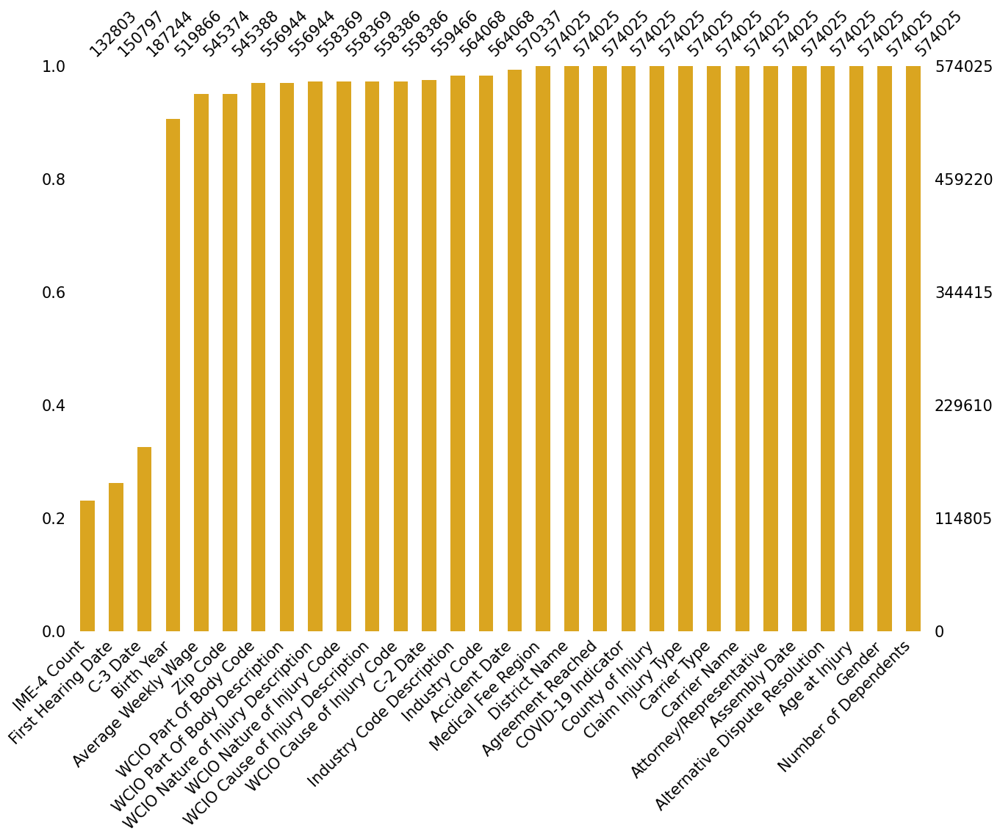

In [27]:
msno.bar(train, figsize=(15, 10), fontsize=15, color='goldenrod', sort='ascending')

2. `Missingno` Heatmap visualization

We can also use the `missingno` library to explore the relationships between missing values across column pairs. By analyzing the nullity correlation, we can identify columns whose missing data are either directly or inversely related. In this analysis, only columns with missing values are considered.

A nullity correlation value close to 1 indicates a strong positive relationship, meaning that if one column has a missing value, the other is likely to have one as well. On the other hand, a correlation value near -1 suggests a strong inverse relationship, where one column is missing values while the other is not. Values around zero indicate no significant correlation between the missing data in the two columns.

<Axes: >

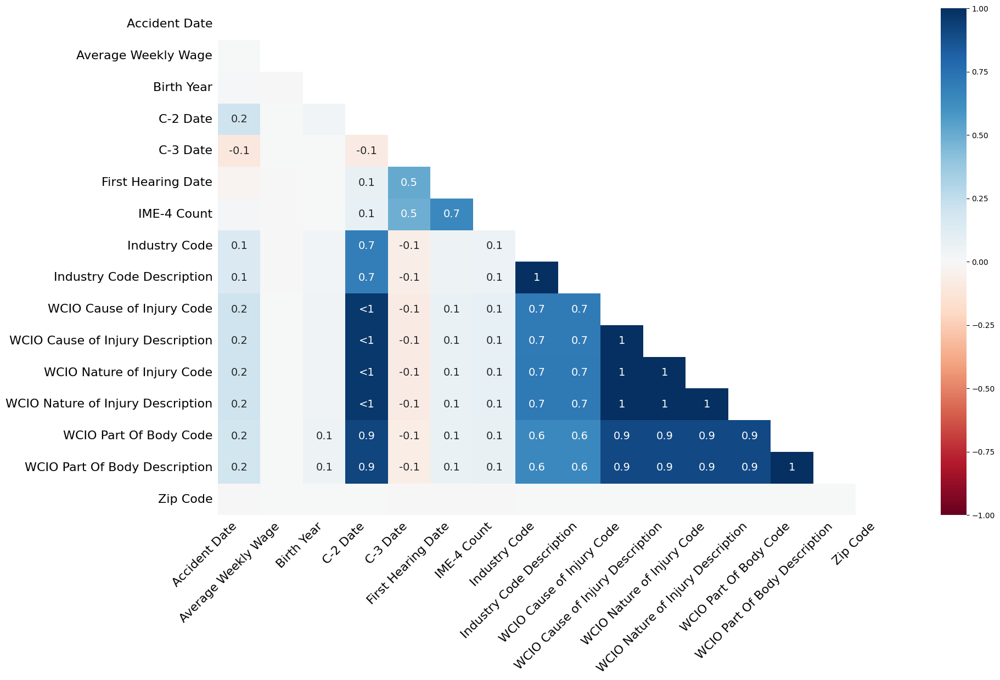

In [28]:
msno.heatmap(train)

Correlations:

- WCIO related codes (Cause of Injury, Nature of Injury, Part of Body) and their descriptions show perfect correlations (value of 1). This indicates that if data is missing in one of these fields, it is also missing in the corresponding description fields - Missing Not At Random (MNAR); 

- `Industry Code` and `Industry Code Description` also show a strong positive correlation of 1 - Missing Not At Random (MNAR);

- `Industry Code` and `Industry Code Description` have a strong positive correlation with all WCIO related codes and descriptions, 0.7 and 0.6 for the Part of Body code and description;

- 'C-2 Date' has a very strong correlation, near 1, with all WCIO related codes and description. It also has with 'Industry Code' and 'Industry Code Description' a correlation of 0.7;

- Some features like 'Average Weekly Wage', 'Birth Year' and 'Zip Code' have very weak correlations (close to zero), indicating they are missing independently of other variables - Missing Completely at Random (MCAR);

- 'First Hearing Date', 'IME-4 Count' and 'C-3 Date' have strong correlation with most variables, some positive others negative. However, from the previous analysis we saw that these variables have the highest number of missing values, hence these correlations might be trivial.

#### Filling the missing values

`IME-4 Count`

Assuming that the missing values in `IME-4 Count` means 0 claims received, we are going to fill it with 0.

In [29]:
train['IME-4 Count'] = train['IME-4 Count'].fillna(0)
test['IME-4 Count'] = test['IME-4 Count'].fillna(0)

<br>

`WCIO features`

For the WCIO variables, we will assume the missing values as not applicable to the claim. Therefore, we will fill these missing values with 0.

In [30]:
train["Industry Code"] = train["Industry Code"].fillna(0)
test["Industry Code"] = test["Industry Code"].fillna(0)

In [31]:
train["Industry Code Description"] = train["Industry Code Description"].fillna('Not Aplicable')
test["Industry Code Description"] = test["Industry Code Description"].fillna('Not Aplicable')

In [32]:
train["WCIO Cause of Injury Code"] = train["WCIO Cause of Injury Code"].fillna(0)
test["WCIO Cause of Injury Code"] = test["WCIO Cause of Injury Code"].fillna(0)

In [33]:
train["WCIO Cause of Injury Description"] = train["WCIO Cause of Injury Description"].fillna('Not Aplicable')
test["WCIO Cause of Injury Description"] = test["WCIO Cause of Injury Description"].fillna('Not Aplicable')


In [34]:
train["WCIO Nature of Injury Code"] = train["WCIO Nature of Injury Code"].fillna(0)
test["WCIO Nature of Injury Code"] = test["WCIO Nature of Injury Code"].fillna(0)

In [35]:
train["WCIO Nature of Injury Description"] = train["WCIO Nature of Injury Description"].fillna('Not Aplicable')
test["WCIO Nature of Injury Description"] = test["WCIO Nature of Injury Description"].fillna('Not Aplicable')

In [36]:
train["WCIO Part Of Body Code"] = train["WCIO Part Of Body Code"].fillna(0)
test["WCIO Part Of Body Code"] = test["WCIO Part Of Body Code"].fillna(0)

In [37]:
train["WCIO Part Of Body Description"] = train["WCIO Part Of Body Description"].fillna('Not Aplicable')
test["WCIO Part Of Body Description"] = test["WCIO Part Of Body Description"].fillna('Not Aplicable')

<br>

`Date Features`

Changing `Date` columns to a time type.

Converting these datetime columns to only the date, which removes the time component.

In [38]:
train['Accident Date'] = pd.to_datetime(train['Accident Date']).dt.date
train['Assembly Date'] = pd.to_datetime(train['Assembly Date']).dt.date
train["C-2 Date"] = pd.to_datetime(train["C-2 Date"]).dt.date
train["C-3 Date"] = pd.to_datetime(train["C-3 Date"]).dt.date
train["First Hearing Date"] = pd.to_datetime(train["First Hearing Date"]).dt.date

In [39]:
test['Accident Date'] = pd.to_datetime(test['Accident Date']).dt.date
test['Assembly Date'] = pd.to_datetime(test['Assembly Date']).dt.date
test["C-2 Date"] = pd.to_datetime(test["C-2 Date"]).dt.date
test["C-3 Date"] = pd.to_datetime(test["C-3 Date"]).dt.date
test["First Hearing Date"] = pd.to_datetime(test["First Hearing Date"]).dt.date

New features will be created based on these features.

<br>

#### 4.1.2 Inconsistent values and noisy data

##### 4.1.2.1 `Age at Injury`

In [40]:
from bokeh.io import output_notebook
from bokeh.plotting import figure, show
import numpy as np

output_notebook()

hist, edges = np.histogram(train['Age at Injury'], bins=40)

p = figure(title='Histogram of Age at Injury')

p.quad(
    top=hist,
    bottom=0,
    left=edges[:-1],
    right=edges[1:],
    fill_color='#FF8C00',
    line_color='black',      
    line_width=1 
)

# Display the plot in the notebook
show(p)


Loading BokehJS ...

In a previous analysis, we identified some inconsistencies in the 'Age at Injury' column, where certain values did not seem to make sense. The histogram above shows the distribution of ages, revealing that some individuals are reported to be younger than 15 or older than 90. These values are considered inconsistent, as it is unlikely that people within these age ranges would be actively working.

<br>

##### 4.1.2.2 `Accident Date`

In [41]:
train['Accident Date'].describe()

count         570337
unique          5539
top       2020-03-01
freq            1245
Name: Accident Date, dtype: object

The earliest recorded accident occurred on the 6th of September of 1961, while the most recent incident was on 29th of September of 2023. Additionally, half of the accidents occurred on or before 27th of June of 2021. We will adress this after data partitioning.

<br>

##### 4.1.2.3 `Average Weekly Wage`

From previous insights, we saw that there is a significant variation in income levels among individuals in our dataset. A notable number of individuals have reported no income, which heavily influences the mean. However, there are also individuals with very high average weekly wages, some of millions. 

In the boxplot below, the distribution of the `Average Weekly Wage` is visually represented.

In [42]:
import plotly.express as px

fig = px.box(train, x='Average Weekly Wage')

fig.update_traces(marker_color='red',  
                  line_color='black')
fig.show()

In order to reduce the skewness of the variable `Average Weekly Wage` a logarithm transformation will be applied. By converting the wages to their logarithmic values, we can mitigate the impact of extreme values.

In [43]:
train['Average Weekly Wage'] = np.log10(train['Average Weekly Wage'] + 1)

In [44]:
test['Average Weekly Wage'] = np.log10(test['Average Weekly Wage'] + 1)

We add 1 to the whole column to avoid taking the logarithm of zero, which is undefined.

In [45]:
train['Average Weekly Wage'].describe()

count    545374.000000
mean          1.158958
std           1.474437
min           0.000000
25%           0.000000
50%           0.000000
75%           2.925312
max           6.451492
Name: Average Weekly Wage, dtype: float64

The summary statistics for the logarithmic transformation of the `Average Weekly Wage` still reveals a distribution characterized by a significant number of individuals reporting zero or very low wages, as indicated by the mean, approximately 1.16, and a median of 0. Additionally, the low standard deviation (1.47) suggests less variability in wage.

<br>

##### 4.1.2.4 `Zip Code`

In this variable, we noticed that some zip codes are represented inconsistently: for instance, the zip code 10567 appears both as a string ('10567') and as a float (10567.0). This inconsistency increases the count of unique values in this feature. To address this, we will standardize all numeric zip codes to remove decimal points and convert them to strings.

Additionally, there are some values that include alphabetical characters. We will not modify these, as this may have some meaning behind it.

In [46]:
train["Zip Code"].unique()

array(['13662', '14569', '12589', ..., 'G9B0Y', '15143', '07122'],
      dtype=object)

In [47]:
len(train["Zip Code"].unique())

10061

In [48]:
len(train[train["Zip Code"] == '10567'])

494

In [49]:
len(train[train["Zip Code"] == 10567.0])

14

We are going to fix this after data partitioning.

<br>

##### 4.1.2.5 `WCIO codes`

Since our dataset includes both the WCIO code and its corresponding description, we will create a lookup table to reference the code and description as needed. Therefore, we will remove the columns that contain redundant descriptions, as there is already a column with the codes that provides the same information.

##### 4.1.2.5.1 `WCIO Cause Of Injury`

In [50]:
def create_lookup(dataframe, code_column, description_column):
    lookup = dataframe[[code_column, description_column]].drop_duplicates()
    lookup = lookup.reset_index(drop=True)
    lookup[code_column] = lookup[code_column].astype('Int64')
    lookup = lookup.sort_values(by=code_column).reset_index(drop=True)
    
    return lookup


Creating a lookup table for `WCIO Cause Of Injury`.

In [51]:
WCIO_cause_Lookup = create_lookup(train, 'WCIO Cause of Injury Code', 'WCIO Cause of Injury Description')

<br>

##### 4.1.2.5.2 `WCIO Nature Of Injury`

Creating a lookup table for `WCIO Nature Of Injury`.

In [52]:
WCIO_nature_Lookup = create_lookup(train, 'WCIO Nature of Injury Code', 'WCIO Nature of Injury Description')

<br>

##### 4.1.2.5.3 `WCIO Part of Body `

Creating a lookup table for `WCIO Part of Body`.

In [53]:
WCIO_bodyPart_Lookup = create_lookup(train, 'WCIO Part Of Body Code', 'WCIO Part Of Body Description')

<br>

##### 4.1.2.6 `Industry Code and Description`

Creating a lookup table for `Industry Code`.

In [54]:
IndustryCode_Lookup = create_lookup(train, 'Industry Code', 'Industry Code Description')

<br>

## 5. Visualizations

- ### *Univariate Analysis*

#### `Age at Injury`

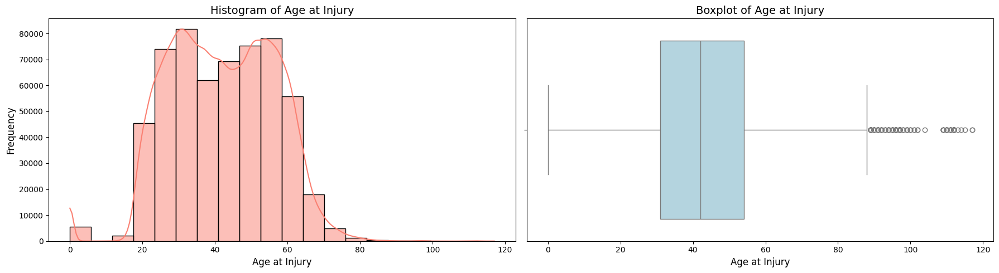

In [55]:
def plot_numeric_variable(data, variable, hue=None):  
    fig, ax = plt.subplots(1, 2, figsize=(18, 5))
    
    #1
    sns.histplot(data=data, x=variable, ax=ax[0], kde=True, color='salmon', bins=20)
    ax[0].set_title(f"Histogram of {variable}", fontsize=14)
    ax[0].set_xlabel(variable, fontsize=12)
    ax[0].set_ylabel("Frequency", fontsize=12)
    
    #2
    sns.boxplot(data=data, x=variable, ax=ax[1], color='lightblue')
    ax[1].set_title(f"Boxplot of {variable}", fontsize=14)
    ax[1].set_xlabel(variable, fontsize=12)
    ax[1].set_ylabel("", fontsize=12)
    
    fig.tight_layout()
    plt.show()
plot_numeric_variable(data=train, variable='Age at Injury', hue='Claim Injury Type')

#### `Average Weekly Wage`

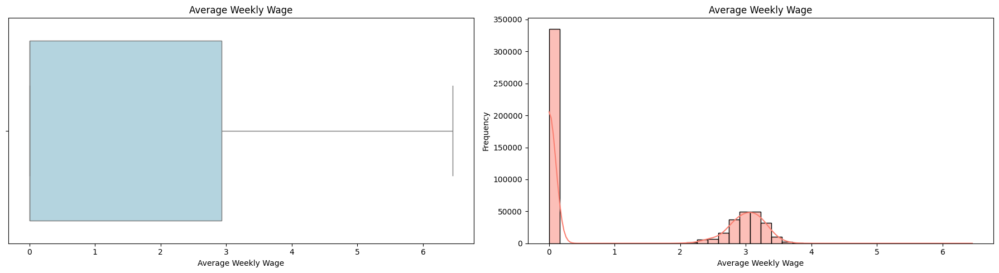

In [56]:
fig, ax = plt.subplots(1, 2, figsize=(18, 5))

# 1
sns.boxplot(data=train, x='Average Weekly Wage', ax=ax[0], color='lightblue')  
ax[0].set_title("Average Weekly Wage")
ax[0].set_xlabel("Average Weekly Wage")

# 2
sns.histplot(data=train, x='Average Weekly Wage', bins=40, ax=ax[1], kde=True, color='salmon') 
ax[1].set_title("Average Weekly Wage")
ax[1].set_xlabel("Average Weekly Wage")
ax[1].set_ylabel("Frequency")

fig.tight_layout()
plt.show()

#### `IME-4 Count` 

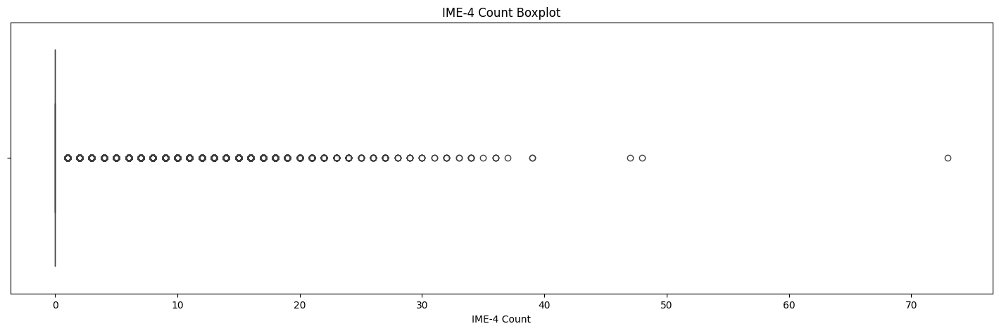

In [57]:
fig, ax = plt.subplots(figsize=(18, 5))

sns.boxplot(data=train, x='IME-4 Count', ax=ax, whis=1.5)
ax.set_title("IME-4 Count Boxplot")
ax.set_xlabel("IME-4 Count")

plt.show()

#### `Industry Code`

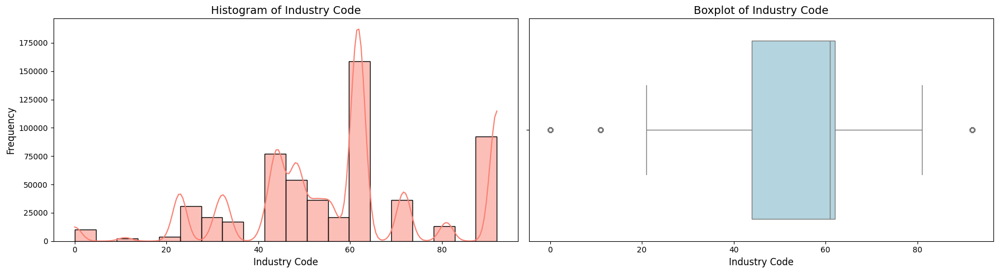

In [58]:
plot_numeric_variable(data=train, variable='Industry Code', hue='Claim Injury Type')

#### `WCIO Codes`

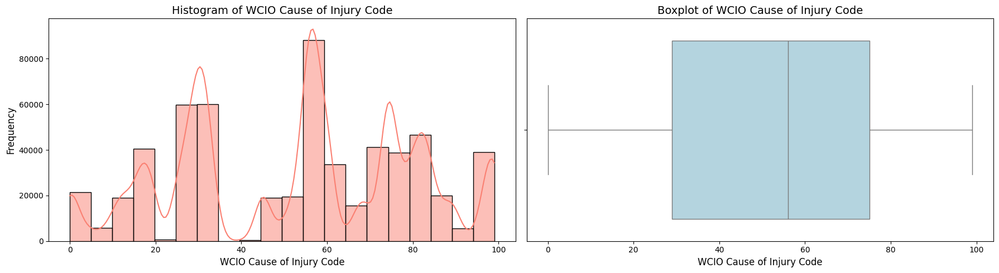

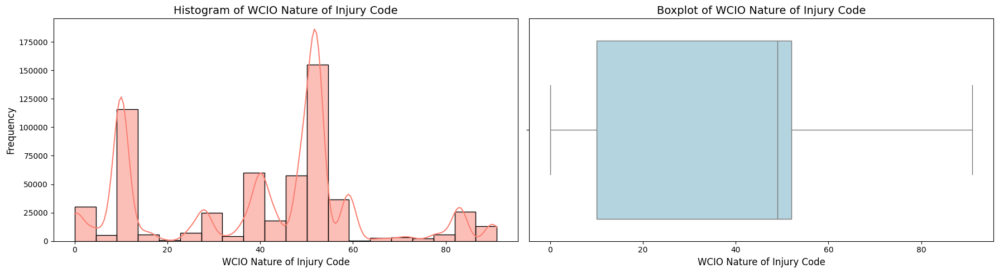

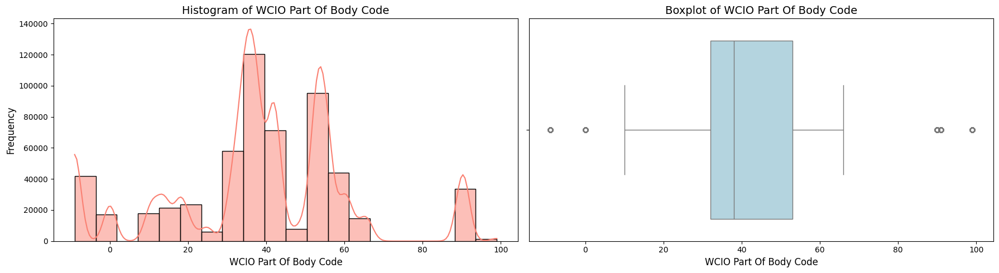

In [59]:
plot_numeric_variable(data=train, variable='WCIO Cause of Injury Code', hue='Claim Injury Type')
plot_numeric_variable(data=train, variable='WCIO Nature of Injury Code', hue='Claim Injury Type')
plot_numeric_variable(data=train, variable='WCIO Part Of Body Code', hue='Claim Injury Type')

`Date Columns`

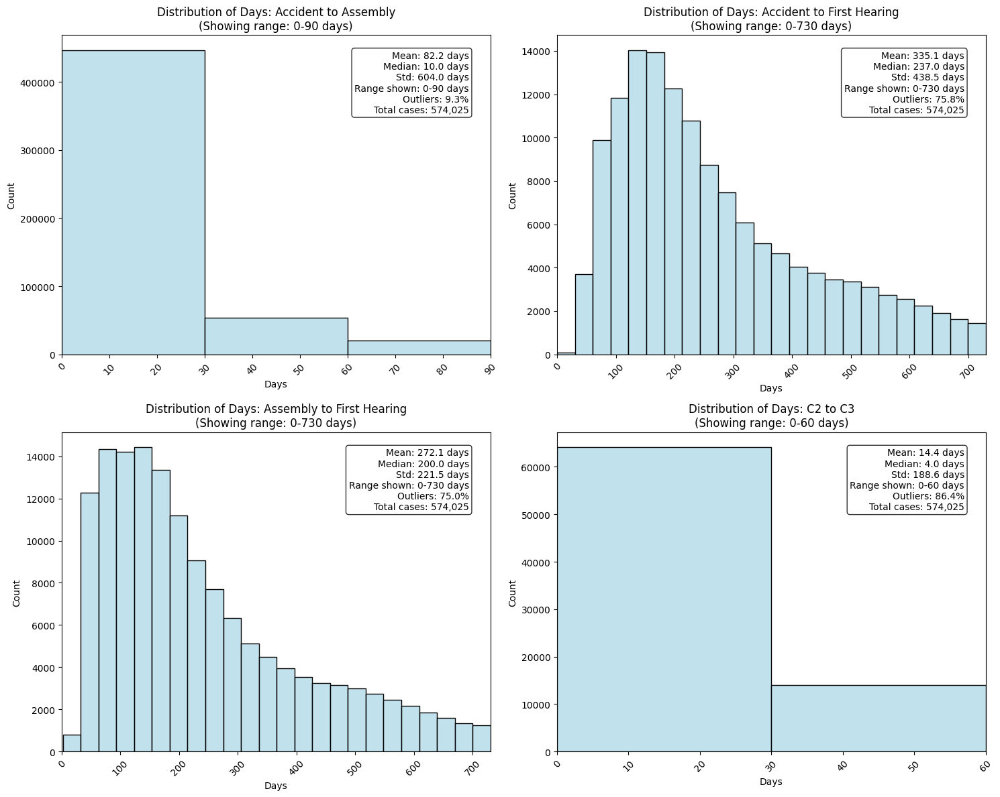

In [60]:
def analyze_date_intervals(df):
    """
    Analyze intervals between different date variables with adjusted scales
    """
    # Convert date columns to datetime
    date_cols = ['Accident Date', 'Assembly Date', 'C-2 Date', 'C-3 Date', 'First Hearing Date']
    date_df = df[date_cols].apply(pd.to_datetime)

    # Create figure
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    axes_flat = axes.flatten()

    # Define intervals to analyze
    intervals = [
        ('Accident Date', 'Assembly Date', 'Accident to Assembly', 90),  # Show up to 90 days
        ('Accident Date', 'First Hearing Date', 'Accident to First Hearing', 730),  # Show up to 2 years
        ('Assembly Date', 'First Hearing Date', 'Assembly to First Hearing', 730),  # Show up to 2 years
        ('C-2 Date', 'C-3 Date', 'C2 to C3', 60)  # Show up to 60 days
    ]

    for idx, (start_date, end_date, label, max_days) in enumerate(intervals):
        if all(col in date_df.columns for col in [start_date, end_date]):
            # Calculate interval in days
            interval = (date_df[end_date] - date_df[start_date]).dt.days

            # Filter outliers for visualization but keep them for stats
            interval_filtered = interval[(interval >= 0) & (interval <= max_days)]

            # Plot distribution of intervals
            ax = axes_flat[idx]

            # Create histogram with appropriate bin size
            bin_size = max_days // 30
            sns.histplot(data=interval_filtered, bins=bin_size, ax=ax, color='lightblue')

            # Calculate statistics on full data
            stats = interval.describe()
            outliers_pct = (len(interval) - len(interval_filtered)) / len(interval) * 100

            # Add comprehensive statistics
            stats_text = (
                f"Mean: {stats['mean']:.1f} days\n"
                f"Median: {stats['50%']:.1f} days\n"
                f"Std: {stats['std']:.1f} days\n"
                f"Range shown: 0-{max_days} days\n"
                f"Outliers: {outliers_pct:.1f}%\n"
                f"Total cases: {len(interval):,}"
            )

            ax.text(0.95, 0.95, stats_text,
                   transform=ax.transAxes,
                   verticalalignment='top',
                   horizontalalignment='right',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

            ax.set_title(f'Distribution of Days: {label}\n(Showing range: 0-{max_days} days)')
            ax.set_xlabel('Days')
            ax.set_ylabel('Count')

            # Set x-axis limits
            ax.set_xlim(0, max_days)

            ax.grid(False)

            # Rotate x-axis labels for better readability
            ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    return fig

# To use these functions:
fig = analyze_date_intervals(train)
plt.show()

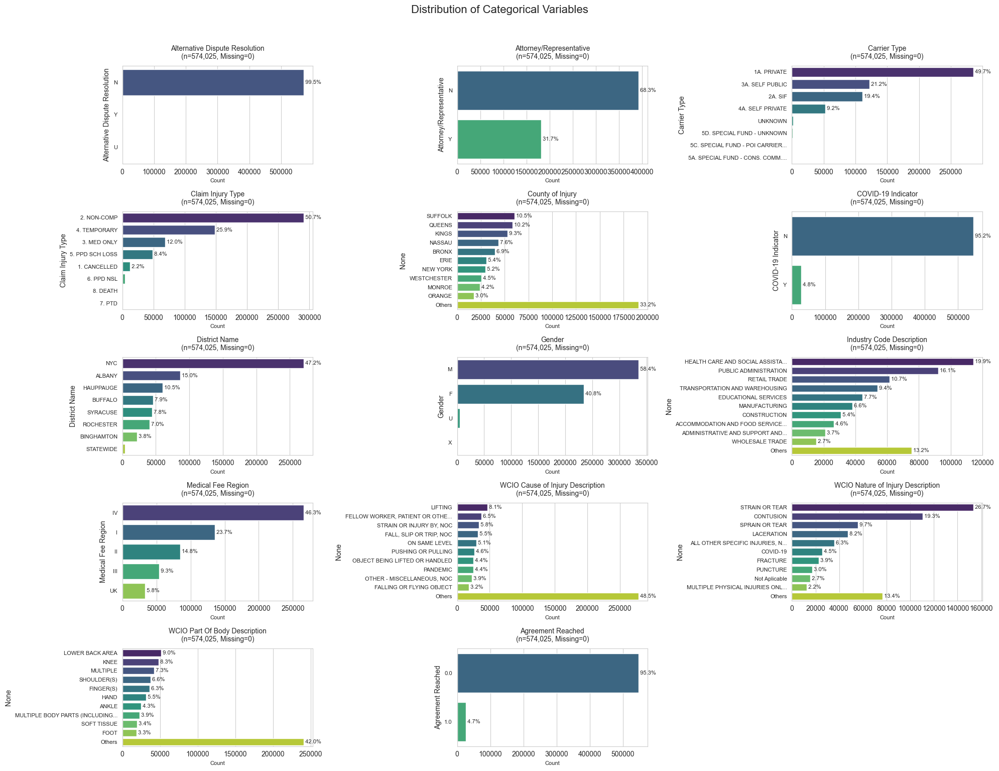

In [61]:
def plot_categorical_distributions(data, figsize=(20, 15), max_categories=10):
    """
    Create bar plots for categorical variables with proper formatting and handling of multiple categories
    """
    # Set the style using seaborn
    sns.set_style("whitegrid")

    # Define categorical columns and verify their presence in the data
    categorical_columns = [
        'Alternative Dispute Resolution',
        'Attorney/Representative',
        'Carrier Type',
        'Claim Injury Type',  
        'County of Injury',
        'COVID-19 Indicator',
        'District Name',
        'Gender',
        'Industry Code Description',
        'Medical Fee Region',
        'WCIO Cause of Injury Description',
        'WCIO Nature of Injury Description',
        'WCIO Part Of Body Description',
        'Agreement Reached',
        'WCB Decision'
    ]

    available_columns = [col for col in categorical_columns if col in data.columns]

    n_cols = 3
    n_rows = (len(available_columns) + n_cols - 1) // n_cols

    # Create figure with a reasonable size
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    fig.suptitle('Distribution of Categorical Variables', fontsize=16, y=1.02)

    # Ensure axes is always a 2D array
    if n_rows == 1:
        axes = np.array([axes])
    if n_cols == 1:
        axes = axes.reshape(-1, 1)

    # Flatten axes for iteration
    axes_flat = axes.flatten()

    for idx, column in enumerate(available_columns):
        try:
            ax = axes_flat[idx]

            # Convert to string if necessary and get value counts
            if data[column].dtype == 'object' or pd.api.types.is_categorical_dtype(data[column]):
                series = data[column]
            else:
                series = data[column].astype(str)

            value_counts = series.value_counts()

            # Handle cases with many categories
            if len(value_counts) > max_categories:
                main_categories = value_counts.head(max_categories)
                others_sum = value_counts[max_categories:].sum()
                value_counts = pd.concat([main_categories, pd.Series({'Others': others_sum})])

            # Create bar plot
            bars = sns.barplot(x=value_counts.values, y=value_counts.index, ax=ax, palette='viridis')

            # Add title and labels
            ax.set_title(f'{column}\n(n={series.notna().sum():,}, Missing={series.isna().sum():,})',
                        fontsize=10, pad=10)
            ax.set_xlabel('Count', fontsize=8)

            # Add percentage labels on bars
            total = value_counts.sum()
            for i, v in enumerate(value_counts.values):
                percentage = (v/total) * 100
                if percentage >= 1:  # Only show percentages >= 1%
                    ax.text(v, i, f' {percentage:.1f}%', va='center', fontsize=8)

            # Adjust layout for better readability
            ax.tick_params(axis='y', labelsize=8)

            # Limit label length if too long
            labels = [str(label)[:30] + '...' if len(str(label)) > 30 else str(label)
                     for label in value_counts.index]
            ax.set_yticklabels(labels)

        except Exception as e:
            print(f"Error plotting {column}: {str(e)}")
            ax.text(0.5, 0.5, f"Error plotting {column}", ha='center', va='center')

    # Remove empty subplots if any
    for j in range(len(available_columns), len(axes_flat)):
        fig.delaxes(axes_flat[j])

    plt.tight_layout()
    return fig

def plot_detailed_categorical(data, column, figsize=(12, 6)):
    """
    Create a detailed bar plot for a specific categorical variable
    """
    sns.set_style("whitegrid")

    try:
        plt.figure(figsize=figsize)

        # Convert to string if necessary
        if data[column].dtype != 'object' and not pd.api.types.is_categorical_dtype(data[column]):
            series = data[column].astype(str)
        else:
            series = data[column]

        value_counts = series.value_counts()
        total = len(data)

        # Create bar plot
        ax = sns.barplot(x=value_counts.index, y=value_counts.values, palette='viridis')

        # Add title and labels
        plt.title(f'Distribution of {column}\n(n={series.notna().sum():,}, Missing={series.isna().sum():,})')
        plt.xlabel(column)
        plt.ylabel('Count')

        # Add percentage labels
        for i, v in enumerate(value_counts.values):
            percentage = (v/total) * 100
            if percentage >= 1:  # Only show percentages >= 1%
                ax.text(i, v, f'{percentage:.1f}%', ha='center', va='bottom')

        # Rotate x-labels if needed
        if len(value_counts.index) > 5 or max(len(str(x)) for x in value_counts.index) > 10:
            plt.xticks(rotation=45, ha='right')

        plt.tight_layout()
        return plt.gcf()

    except Exception as e:
        plt.close()
        print(f"Error plotting {column}: {str(e)}")
        return None

fig = plot_categorical_distributions(train)
plt.show()

<br>

- ### *Bivariate Analysis*

#### `Birth Year` and `Claim Injury Type`

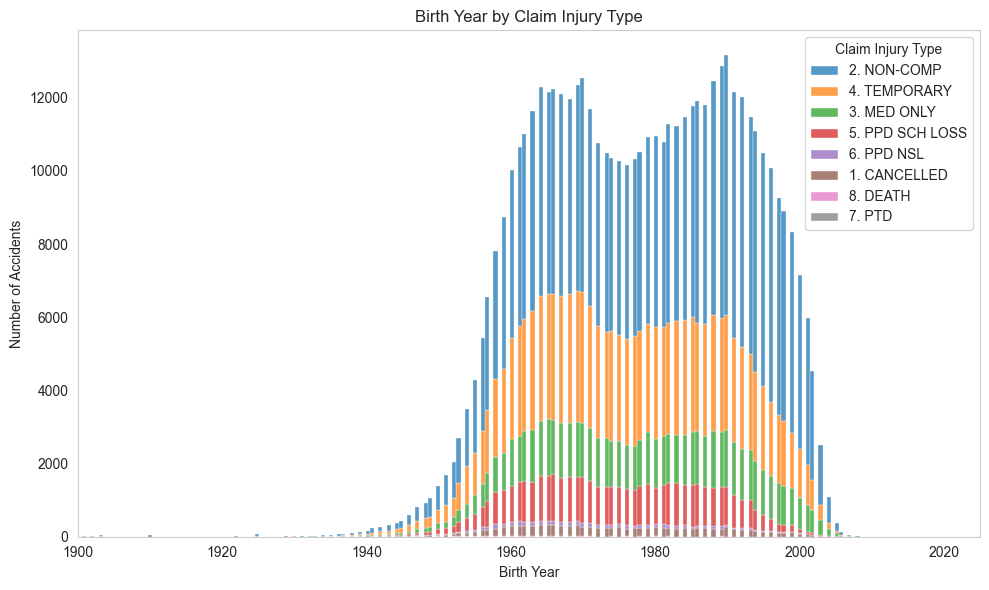

In [62]:
fig, ax = plt.subplots(figsize=(10, 6))
xlim = (1900, 2025)

sns.histplot(data=train, x='Birth Year', hue='Claim Injury Type', multiple='stack')
ax.set_title("Birth Year by Claim Injury Type")
ax.set_ylabel("Number of Accidents")
ax.set_xlim(xlim)
ax.grid(False)
fig.tight_layout()
plt.show()

#### `Number of Dependents`

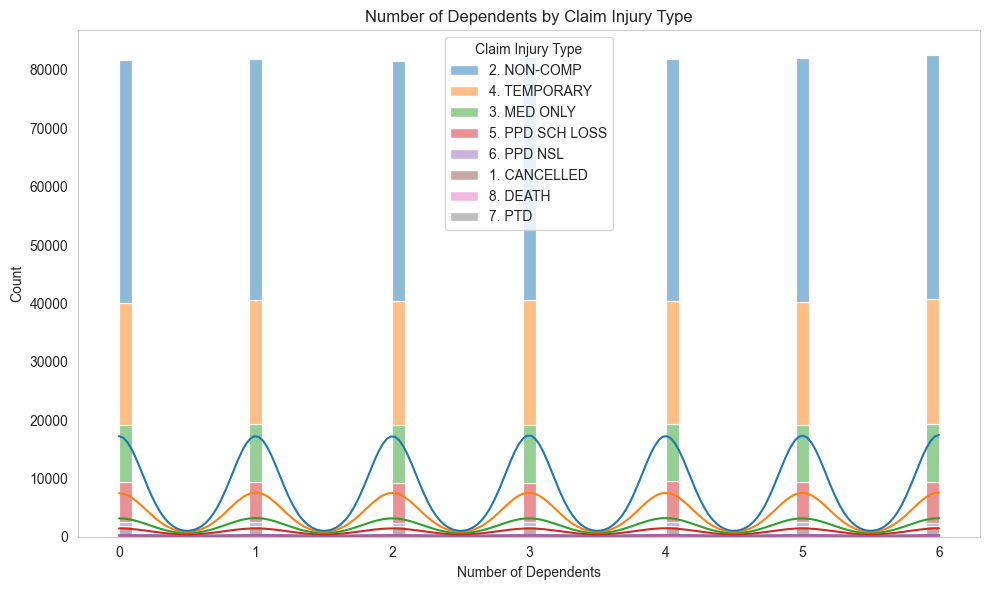

In [63]:
def plot_histogram(data, variable, hue=None):
    fig, ax = plt.subplots(figsize=(10, 6))

    if hue:
        sns.histplot(data=data, x=variable, hue=hue, multiple='stack', ax=ax, kde=True)
        ax.set_title(f"{variable} by {hue}")
        ax.grid(False)
    else:
        sns.histplot(data=data, x=variable, ax=ax, kde=True)
        ax.set_title(f"{variable} Distribution (No Hue)")
    ax.set_ylabel("Count")

    fig.tight_layout()
    plt.show()

plot_histogram(data=train, variable='Number of Dependents', hue='Claim Injury Type')


<br>

- ### *Multivariate Analysis*


Strongest Categorical Correlations:
--------------------------------------------------
COVID-19 Indicator -- WCIO Nature of Injury Description: 0.962
COVID-19 Indicator -- WCIO Cause of Injury Description: 0.953
County of Injury -- District Name: 0.909
COVID-19 Indicator -- WCIO Part Of Body Description: 0.818
County of Injury -- Medical Fee Region: 0.722
Attorney/Representative -- Claim Injury Type: 0.611
District Name -- Medical Fee Region: 0.492
Carrier Type -- Industry Code Description: 0.336
WCIO Cause of Injury Description -- WCIO Nature of Injury Description: 0.327
Alternative Dispute Resolution -- WCIO Cause of Injury Description: 0.282
Alternative Dispute Resolution -- WCIO Nature of Injury Description: 0.282
WCIO Nature of Injury Description -- WCIO Part Of Body Description: 0.281
Attorney/Representative -- WCIO Cause of Injury Description: 0.280
Attorney/Representative -- WCIO Part Of Body Description: 0.271
Alternative Dispute Resolution -- WCIO Part Of Body Description: 0

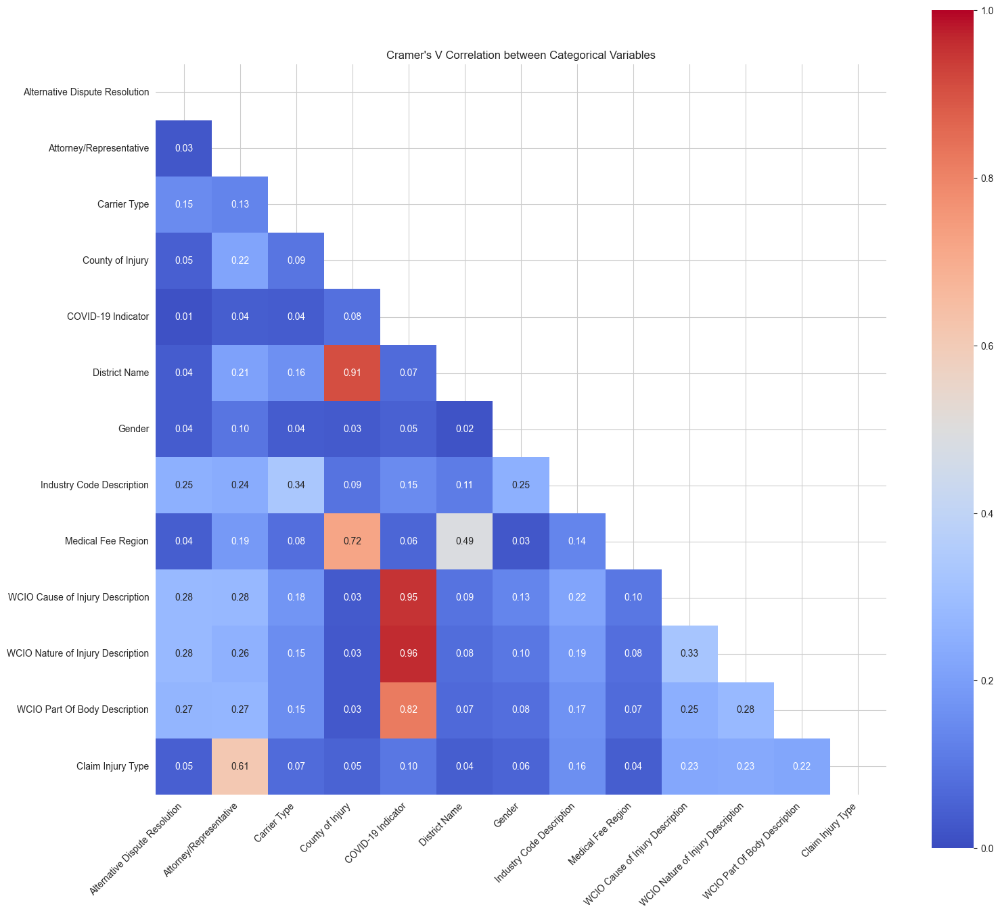

In [64]:
def compute_cramers_v_matrix(df: pd.DataFrame,
                           categorical_cols: Optional[List[str]] = None,
                           threshold: float = 0.0,
                           max_unique_values: int = 100) -> pd.DataFrame:
    """
    Compute Cramer's V correlation matrix for categorical variables.

    Parameters:
    -----------
    df : pandas DataFrame
        Input DataFrame containing the categorical variables
    categorical_cols : list of str, optional
        List of categorical column names. If None, will use all object columns
    threshold : float, optional
        Minimum correlation value to display (0.0 to 1.0)
    max_unique_values : int, optional
        Maximum number of unique values allowed for a categorical variable

    Returns:
    --------
    pd.DataFrame
        Cramer's V correlation matrix
    """
    # If no categorical columns specified, use all object columns
    if categorical_cols is None:
        categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

    # Filter out columns with too many unique values
    valid_cols = []
    for col in categorical_cols:
        n_unique = df[col].nunique()
        if n_unique > max_unique_values:
            warnings.warn(f"Dropping {col}: {n_unique} unique values exceeds maximum of {max_unique_values}")
        else:
            valid_cols.append(col)

    # Initialize the correlation matrix
    n_cols = len(valid_cols)
    cramer_matrix = np.zeros((n_cols, n_cols))

    # Compute Cramer's V for each pair of variables
    for i in range(n_cols):
        for j in range(i, n_cols):  # Only compute upper triangle
            if i == j:
                cramer_matrix[i][j] = 1.0
            else:
                try:
                    # Create contingency table
                    confusion_matrix = pd.crosstab(df[valid_cols[i]], df[valid_cols[j]])

                    # Compute Chi-square and Cramer's V
                    chi2 = chi2_contingency(confusion_matrix)[0]
                    n = confusion_matrix.sum().sum()
                    phi2 = chi2/n
                    r, k = confusion_matrix.shape

                    # Apply correction
                    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
                    rcorr = r-((r-1)**2)/(n-1)
                    kcorr = k-((k-1)**2)/(n-1)

                    # Calculate Cramer's V
                    v = np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

                    # Store value in both triangles of the matrix
                    cramer_matrix[i][j] = v
                    cramer_matrix[j][i] = v

                except Exception as e:
                    warnings.warn(f"Error computing Cramer's V for {valid_cols[i]} and {valid_cols[j]}: {str(e)}")
                    cramer_matrix[i][j] = np.nan
                    cramer_matrix[j][i] = np.nan

    # Convert to DataFrame
    cramer_df = pd.DataFrame(cramer_matrix,
                            index=valid_cols,
                            columns=valid_cols)

    return cramer_df

def plot_cramers_v_heatmap(cramer_df: pd.DataFrame,
                          threshold: float = 0.0,
                          figsize: tuple = (16, 14),
                          cmap: str = 'coolwarm',
                          annot_fmt: str = '.2f') -> None:
    """
    Plot heatmap of Cramer's V correlation matrix.

    Parameters:
    -----------
    cramer_df : pandas DataFrame
        Cramer's V correlation matrix
    threshold : float, optional
        Minimum correlation value to display
    figsize : tuple, optional
        Figure size (width, height)
    cmap : str, optional
        Color map for heatmap
    annot_fmt : str, optional
        Format string for annotation values
    """
    # Apply threshold mask
    mask = np.zeros_like(cramer_df)
    mask[np.triu_indices_from(mask)] = True

    # Create plot
    plt.figure(figsize=figsize)
    sns.heatmap(cramer_df,
                annot=True,
                cmap=cmap,
                fmt=annot_fmt,
                mask=mask,
                square=True,
                vmin=0,
                vmax=1,
                center=0.5)

    plt.title("Cramer's V Correlation between Categorical Variables")
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()

def analyze_categorical_correlations(df: pd.DataFrame,
                                  categorical_cols: Optional[List[str]] = None,
                                  threshold: float = 0.0,
                                  max_unique_values: int = 100,
                                  print_summary: bool = True) -> pd.DataFrame:
    """
    Perform complete Cramer's V analysis including matrix computation and visualization.

    Parameters:
    -----------
    df : pandas DataFrame
        Input DataFrame containing the categorical variables
    categorical_cols : list of str, optional
        List of categorical column names. If None, will use all object columns
    threshold : float, optional
        Minimum correlation value to display
    max_unique_values : int, optional
        Maximum number of unique values allowed for a categorical variable
    print_summary : bool, optional
        Whether to print summary of strongest correlations

    Returns:
    --------
    pd.DataFrame
        Cramer's V correlation matrix
    """
    # Compute Cramer's V matrix
    cramer_df = compute_cramers_v_matrix(df, categorical_cols, threshold, max_unique_values)

    # Plot heatmap
    plot_cramers_v_heatmap(cramer_df, threshold)

    # Print summary if requested
    if print_summary:
        print("\nStrongest Categorical Correlations:")
        print("-" * 50)

        # Get upper triangle of correlation matrix
        upper_tri = cramer_df.where(np.triu(np.ones(cramer_df.shape), k=1).astype(bool))

        # Stack and sort correlations
        stacked = upper_tri.stack().sort_values(ascending=False)

        # Print top correlations
        for (var1, var2), corr in stacked[stacked > threshold].items():
            print(f"{var1} -- {var2}: {corr:.3f}")

    return cramer_df

# Get categorical columns (excluding certain columns if desired)
categorical_cols = [
    'Alternative Dispute Resolution',
    'Attorney/Representative',
    'Carrier Name',
    'Carrier Type',
    'County of Injury',
    'COVID-19 Indicator',
    'District Name',
    'Gender',
    'Industry Code Description',
    'Medical Fee Region',
    'WCIO Cause of Injury Description',
    'WCIO Nature of Injury Description',
    'WCIO Part Of Body Description',
    'Claim Injury Type'
]

# Run the analysis
results = analyze_categorical_correlations(
    df=train,
    categorical_cols=categorical_cols,
    threshold=0.1,  # Show correlations > 0.1
    max_unique_values=100,  # Skip columns with more than 100 unique values
    print_summary=True
)

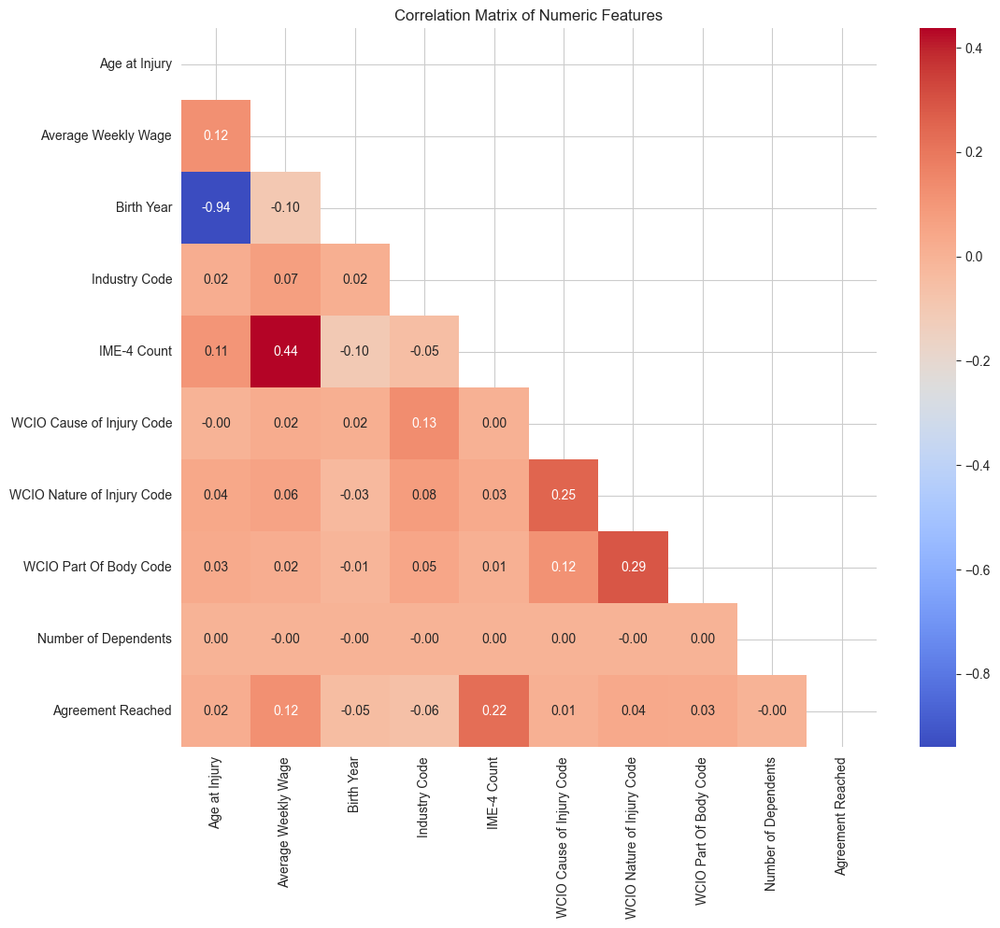

In [65]:
numeric_cols = [
    'Age at Injury',
    'Average Weekly Wage',
    'Birth Year',
    'Industry Code',
    'IME-4 Count',
    'WCIO Cause of Injury Code',
    'WCIO Nature of Injury Code',
    'WCIO Part Of Body Code',
    'Number of Dependents',
    'Agreement Reached'
]

# Calculate the correlation matrix
correlation_matrix = train[numeric_cols].corr()

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

plt.figure(figsize=(12, 10))  
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix of Numeric Features")
plt.show()

<br>

`Claim Type` and other features


Feature Importance for Predicting Claim Injury Type:
                   Feature  Importance
       Average Weekly Wage    0.479804
               IME-4 Count    0.215611
WCIO Nature of Injury Code    0.102876
    WCIO Part Of Body Code    0.095881
 WCIO Cause of Injury Code    0.089943
         Agreement Reached    0.060281
             Industry Code    0.055017
             Age at Injury    0.014814
                Birth Year    0.013224
      Number of Dependents    0.000000

Summary Statistics by Claim Type:

Age at Injury:
                    mean    std  count
Claim Injury Type                     
1. CANCELLED       39.00  19.49   1086
2. NON-COMP        40.76  14.53  25354
3. MED ONLY        42.18  14.04   6002
4. TEMPORARY       43.49  13.47  12935
5. PPD SCH LOSS    45.71  12.34   4205
6. PPD NSL         47.73  12.11    366
7. PTD             47.25  13.46      8
8. DEATH           53.88  13.07     40

Average Weekly Wage:
                   mean   std  count
Claim Injury Type

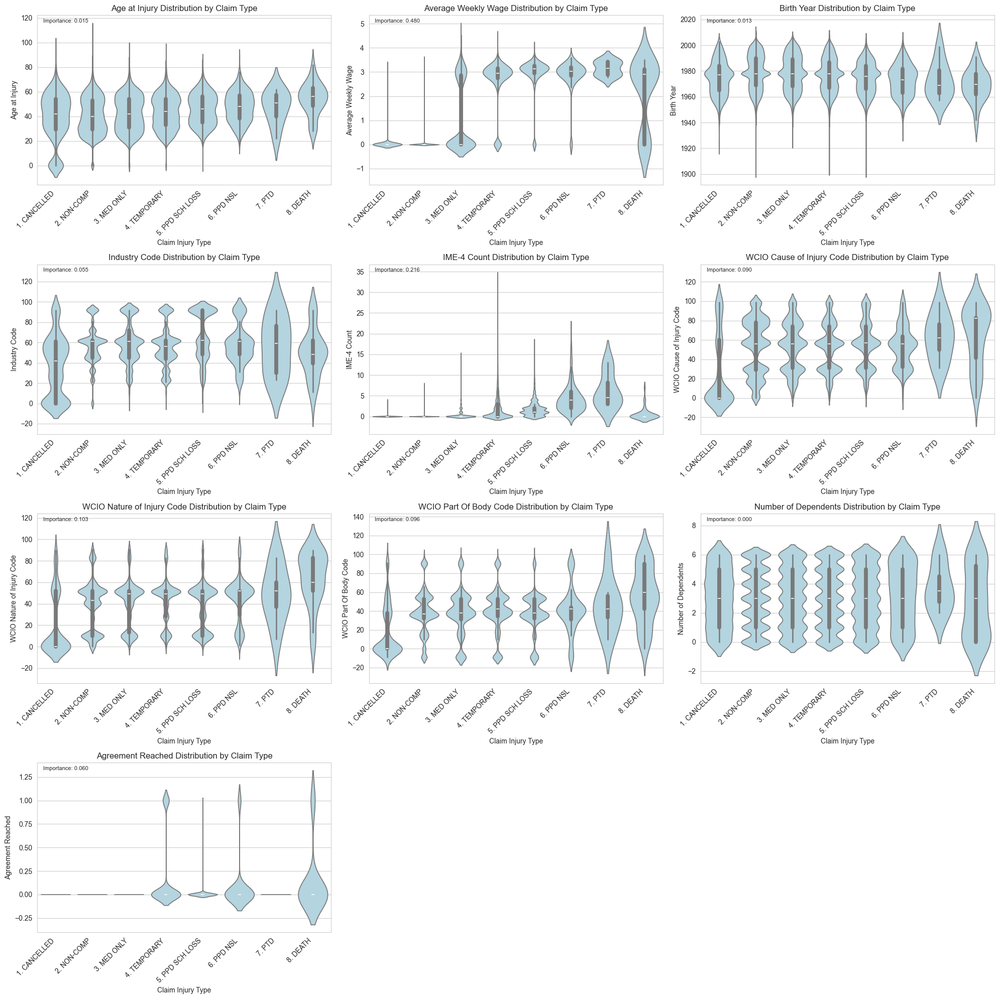

In [66]:
def create_target_focused_analysis(df, sample_size=50000):
    """
    Create visualizations focusing on relationships with Claim Injury Type
    """
    # Create a copy and handle missing values
    df_clean = df.copy()

    # Select all relevant numeric columns
    numeric_cols = [
        'Age at Injury',
        'Average Weekly Wage',
        'Birth Year',
        'Industry Code',
        'IME-4 Count',
        'WCIO Cause of Injury Code',
        'WCIO Nature of Injury Code',
        'WCIO Part Of Body Code',
        'Number of Dependents',
        'Agreement Reached'
    ]

    # Handle missing values
    for col in numeric_cols:
        df_clean[col] = df_clean[col].fillna(df_clean[col].median())

    # Sample the data with stratification
    if len(df_clean) > sample_size:
        df_sample = df_clean.groupby('Claim Injury Type').apply(
            lambda x: x.sample(n=min(len(x), int(sample_size * len(x) / len(df_clean))),
                               random_state=42)
        ).reset_index(drop=True)
    else:
        df_sample = df_clean.copy()

    # Calculate feature importance
    X = df_sample[numeric_cols]
    y = df_sample['Claim Injury Type']
    mi_scores = mutual_info_classif(X, y)
    importance_df = pd.DataFrame({
        'Feature': numeric_cols,
        'Importance': mi_scores
    }).sort_values('Importance', ascending=False)

    # Create subplots for each numeric feature vs Claim Injury Type
    n_cols = 3
    n_rows = (len(numeric_cols) + n_cols - 1) // n_cols
    fig = plt.figure(figsize=(20, 5 * n_rows))

    for idx, feature in enumerate(numeric_cols):
        plt.subplot(n_rows, n_cols, idx + 1)

        # Create violin plot for each feature
        sns.violinplot(
            data=df_sample,
            x='Claim Injury Type',
            y=feature,
            scale='width',
            palette=['lightblue']
        )
        plt.xticks(rotation=45, ha='right')
        plt.title(f'{feature} Distribution by Claim Type')

        # Add feature importance score
        importance = importance_df[importance_df['Feature'] == feature]['Importance'].values[0]
        plt.text(0.02, 0.98, f'Importance: {importance:.3f}',
                 transform=plt.gca().transAxes,
                 verticalalignment='top',
                 fontsize=8)

    plt.tight_layout()

    # Print feature importance summary
    print("\nFeature Importance for Predicting Claim Injury Type:")
    print(importance_df.to_string(index=False))

    # Print summary statistics for each feature by claim type
    print("\nSummary Statistics by Claim Type:")
    for feature in numeric_cols:
        print(f"\n{feature}:")
        print(df_sample.groupby('Claim Injury Type')[feature].agg(['mean', 'std', 'count']).round(2))

    return fig, importance_df

# Create the visualizations
fig, importance_df = create_target_focused_analysis(train)
plt.show()


Feature Correlations with Claim Injury Type:
--------------------------------------------------
Attorney/Representative: 0.611 (2 unique values)
WCIO Nature of Injury Description: 0.233 (57 unique values)
WCIO Cause of Injury Description: 0.226 (75 unique values)
WCIO Part Of Body Description: 0.220 (55 unique values)
Industry Code Description: 0.157 (21 unique values)
COVID-19 Indicator: 0.100 (2 unique values)
Carrier Type: 0.073 (8 unique values)
Gender: 0.057 (4 unique values)
County of Injury: 0.051 (63 unique values)
Alternative Dispute Resolution: 0.046 (3 unique values)
District Name: 0.042 (8 unique values)
Medical Fee Region: 0.039 (5 unique values)


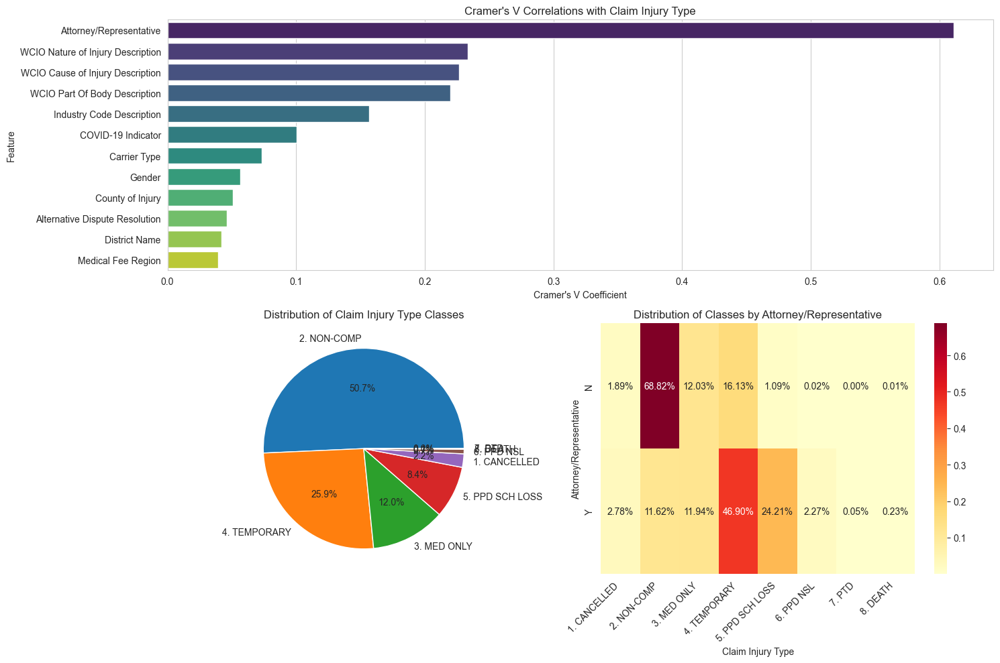

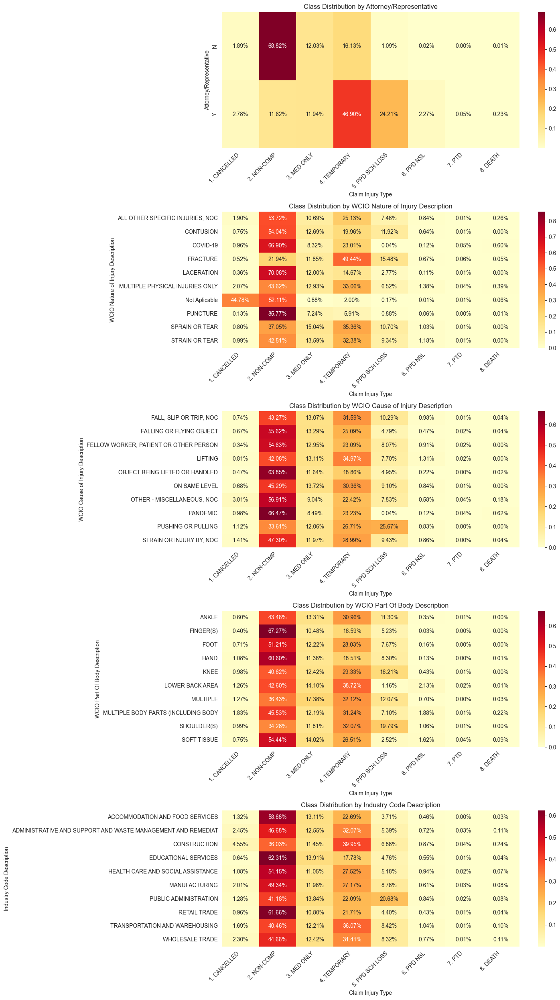

In [67]:
def plot_feature_class_distributions(df: pd.DataFrame,
                                   target_col: str,
                                   features: List[str],
                                   max_categories: int = 10,
                                   figsize: Optional[tuple] = None) -> None:
    """
    Plot detailed class distributions for selected features.

    Parameters:
    -----------
    df : pandas DataFrame
        Input DataFrame
    target_col : str
        Name of the target column
    features : list of str
        List of features to analyze
    max_categories : int
        Maximum number of categories to show for each feature
    figsize : tuple, optional
        Size of the figure. If None, will be calculated based on number of features
    """
    if figsize is None:
        figsize = (15, 5 * len(features))

    plt.figure(figsize=figsize)

    for idx, feature in enumerate(features, 1):
        # Get the top categories by frequency
        top_cats = df[feature].value_counts().nlargest(max_categories).index

        # Filter DataFrame for top categories
        df_filtered = df[df[feature].isin(top_cats)]

        # Create cross tabulation
        cross_tab = pd.crosstab(df_filtered[feature],
                               df_filtered[target_col],
                               normalize='index')

        plt.subplot(len(features), 1, idx)
        sns.heatmap(cross_tab, annot=True, fmt='.2%', cmap='YlOrRd')
        plt.title(f"Class Distribution by {feature}")
        plt.xticks(rotation=45, ha='right')

    plt.tight_layout()

def analyze_target_correlations(df: pd.DataFrame,
                              target_col: str = 'Claim Injury Type',
                              categorical_cols: Optional[List[str]] = None,
                              max_unique_values: int = 100,
                              figsize: tuple = (15, 10)) -> pd.DataFrame:
    """
    Compute and visualize Cramer's V correlations between categorical features and target variable.
    """
    # If no categorical columns specified, use all object columns except target
    if categorical_cols is None:
        categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

    # Remove target column from predictors if present
    if target_col in categorical_cols:
        categorical_cols.remove(target_col)

    # Filter out columns with too many unique values
    valid_cols = []
    for col in categorical_cols:
        n_unique = df[col].nunique()
        if n_unique > max_unique_values:
            warnings.warn(f"Dropping {col}: {n_unique} unique values exceeds maximum of {max_unique_values}")
        else:
            valid_cols.append(col)

    # Calculate Cramer's V for each predictor with target
    correlations = []
    for col in valid_cols:
        try:
            # Create contingency table
            confusion_matrix = pd.crosstab(df[col], df[target_col])

            # Compute Chi-square and Cramer's V
            chi2 = chi2_contingency(confusion_matrix)[0]
            n = confusion_matrix.sum().sum()
            phi2 = chi2/n
            r, k = confusion_matrix.shape

            # Apply correction
            phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
            rcorr = r-((r-1)**2)/(n-1)
            kcorr = k-((k-1)**2)/(n-1)

            # Calculate Cramer's V
            v = np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

            correlations.append({
                'Feature': col,
                'Cramers_V': v,
                'Unique_Values': df[col].nunique()
            })

        except Exception as e:
            warnings.warn(f"Error computing Cramer's V for {col}: {str(e)}")

    # Create and sort results DataFrame
    results_df = pd.DataFrame(correlations)
    results_df = results_df.sort_values('Cramers_V', ascending=False)

    # Create visualization
    fig = plt.figure(figsize=figsize)

    # Plot 1: Cramer's V correlations
    ax1 = plt.subplot2grid((2, 2), (0, 0), colspan=2)
    sns.barplot(data=results_df, x='Cramers_V', y='Feature', palette='viridis')
    ax1.set_title(f"Cramer's V Correlations with {target_col}")
    ax1.set_xlabel("Cramer's V Coefficient")

    # Plot 2: Target class distribution
    ax2 = plt.subplot2grid((2, 2), (1, 0))
    target_dist = df[target_col].value_counts()
    plt.pie(target_dist, labels=target_dist.index, autopct='%1.1f%%')
    ax2.set_title(f"Distribution of {target_col} Classes")

    # Plot 3: Top feature distribution by class
    ax3 = plt.subplot2grid((2, 2), (1, 1))
    if not results_df.empty:
        top_feature = results_df.iloc[0]['Feature']
        cross_tab = pd.crosstab(df[top_feature], df[target_col], normalize='index')
        sns.heatmap(cross_tab, annot=True, fmt='.2%', cmap='YlOrRd')
        ax3.set_title(f"Distribution of Classes by {top_feature}")
        plt.xticks(rotation=45, ha='right')

    plt.tight_layout()

    # Print summary
    print(f"\nFeature Correlations with {target_col}:")
    print("-" * 50)
    for _, row in results_df.iterrows():
        print(f"{row['Feature']}: {row['Cramers_V']:.3f} ({row['Unique_Values']} unique values)")

    return results_df

# Example usage
categorical_cols = [
    'Alternative Dispute Resolution',
    'Attorney/Representative',
    'Carrier Name',
    'Carrier Type',
    'County of Injury',
    'COVID-19 Indicator',
    'District Name',
    'Gender',
    'Industry Code Description',
    'Medical Fee Region',
    'WCIO Cause of Injury Description',
    'WCIO Nature of Injury Description',
    'WCIO Part Of Body Description',
]

# Run main analysis
results = analyze_target_correlations(
    df=train,
    target_col='Claim Injury Type',
    categorical_cols=categorical_cols,
    max_unique_values=100
)

# Plot detailed distributions for top 5 correlated features
top_features = results['Feature'].head(5).tolist()
plot_feature_class_distributions(
    df=train,
    target_col='Claim Injury Type',
    features=top_features
)

Removing from the dataset description columns.

In [68]:
train = train.drop(columns=['WCIO Nature of Injury Description'])
test = test.drop(columns=['WCIO Nature of Injury Description'])

train = train.drop(columns=['WCIO Cause of Injury Description'])
test = test.drop(columns=['WCIO Cause of Injury Description'])

train = train.drop(columns=['WCIO Part Of Body Description'])
test = test.drop(columns=['WCIO Part Of Body Description'])

train = train.drop(columns=['Industry Code Description'])
test = test.drop(columns=['Industry Code Description'])

<br>

 Target Definition

The target variable, `Claim Injury Type`, is an ordinal feature with values ranging from 1 to 8, representing different injury classifications.

In [69]:
train['Claim Injury Type'].unique()

array(['2. NON-COMP', '4. TEMPORARY', '3. MED ONLY', '5. PPD SCH LOSS',
       '6. PPD NSL', '1. CANCELLED', '8. DEATH', '7. PTD'], dtype=object)

Given this we will encode it after splitting the data.

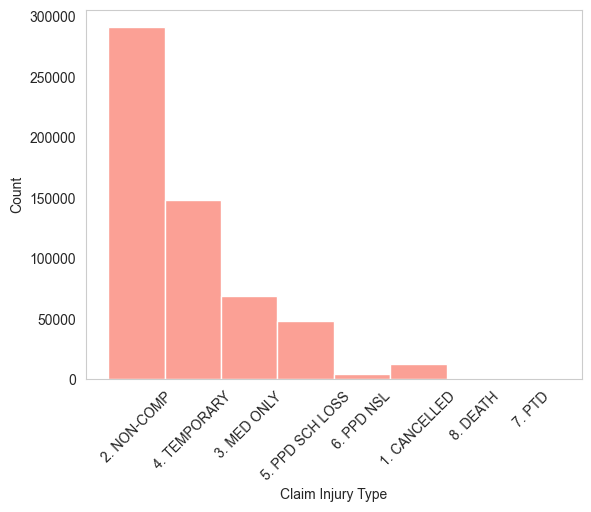

In [70]:
sns.histplot(data=train, x='Claim Injury Type', color='salmon')
plt.xticks(rotation=45)
plt.grid(False)
plt.show()

The plot above clearly indicates that we are facing a class imbalance problem. Specifically, the `Injury Magnitude` category labeled as 2 is the most prevalent.

<br>

# Export

Exporting the data.

In [74]:
train.to_csv('../Data/train_explored.csv', index=True)

In [75]:
test.to_csv('../Data/test_explored.csv', index=True)